
## Overview

This notebook will show you how to create and query a table or DataFrame that you uploaded to DBFS. [DBFS](https://docs.databricks.com/user-guide/dbfs-databricks-file-system.html) is a Databricks File System that allows you to store data for querying inside of Databricks. This notebook assumes that you have a file already inside of DBFS that you would like to read from.

This notebook is written in **Python** so the default cell type is Python. However, you can use different languages by using the `%LANGUAGE` syntax. Python, Scala, SQL, and R are all supported.

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, regexp_replace
from pyspark.ml.feature import VectorAssembler, MinMaxScaler
import matplotlib.pyplot as plt
# Initialize Spark Session
spark = SparkSession.builder \
    .appName("DecisionTreeModel") \
    .getOrCreate()
spark.sparkContext.setLogLevel("ERROR")

# File location and type
file_location = "/FileStore/tables/market_tracker.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df)

PERIOD_BEGIN,PERIOD_END,PERIOD_DURATION,REGION_TYPE,REGION_TYPE_ID,TABLE_ID,IS_SEASONALLY_ADJUSTED,REGION,CITY,STATE,STATE_CODE,PROPERTY_TYPE,PROPERTY_TYPE_ID,MEDIAN_SALE_PRICE,MEDIAN_SALE_PRICE_MOM,MEDIAN_SALE_PRICE_YOY,MEDIAN_LIST_PRICE,MEDIAN_LIST_PRICE_MOM,MEDIAN_LIST_PRICE_YOY,MEDIAN_PPSF,MEDIAN_PPSF_MOM,MEDIAN_PPSF_YOY,MEDIAN_LIST_PPSF,MEDIAN_LIST_PPSF_MOM,MEDIAN_LIST_PPSF_YOY,HOMES_SOLD,HOMES_SOLD_MOM,HOMES_SOLD_YOY,PENDING_SALES,PENDING_SALES_MOM,PENDING_SALES_YOY,NEW_LISTINGS,NEW_LISTINGS_MOM,NEW_LISTINGS_YOY,INVENTORY,INVENTORY_MOM,INVENTORY_YOY,MONTHS_OF_SUPPLY,MONTHS_OF_SUPPLY_MOM,MONTHS_OF_SUPPLY_YOY,MEDIAN_DOM,MEDIAN_DOM_MOM,MEDIAN_DOM_YOY,AVG_SALE_TO_LIST,AVG_SALE_TO_LIST_MOM,AVG_SALE_TO_LIST_YOY,SOLD_ABOVE_LIST,SOLD_ABOVE_LIST_MOM,SOLD_ABOVE_LIST_YOY,PRICE_DROPS,PRICE_DROPS_MOM,PRICE_DROPS_YOY,OFF_MARKET_IN_TWO_WEEKS,OFF_MARKET_IN_TWO_WEEKS_MOM,OFF_MARKET_IN_TWO_WEEKS_YOY,PARENT_METRO_REGION,PARENT_METRO_REGION_METRO_CODE,LAST_UPDATED
2016-02-01,2016-02-29,30,metro,-2,30260,false,"Lewisburg, PA metro area",null,null,PA,All Residential,-1,210000,0.3418530351,0.2103746398,174325,0.0649053146,-0.2079736483,99.715099715,0.237616217,-0.137879336,111.238268446,0.218245186,0.2359807605,13,0.1818181818,-0.07142857143,13,0.1818181818,-0.07142857143,32,1.285714286,0.6842105263,196,0.07692307692,0.05376344086,15.1,-1.4,1.8,112,-36,6,0.9525697163,0.01546177951,0.0004676907892,0.1538461538,0.1538461538,0.1538461538,NA,NA,NA,0,0,0,"Lewisburg, PA",30260,2025-04-18T14:40:47.550+0000
2016-08-01,2016-08-31,30,metro,-2,37964,false,"Philadelphia, PA metro area",null,null,PA,All Residential,-1,181000,-0.02162162162,0.05079825835,167200,-0.07059477487,0.07870967742,131.578947368,-0.02617756952,0.008234440238,122.870564024,-0.06253543394,0.06501605367,2370,0.03538663172,0.196365472,2306,0.08415608839,0.160543533,2537,0.02257154373,-0.006267136702,8144,-0.05795257374,-0.1748733536,3.4,-0.4,-1.6,44,8,-6,0.9662681433,0.0005809863864,0.007402046423,0.1540084388,-0.009818559871,0.01619925154,0.2264243615,0.002132863517,-0.008833997169,0.1339982654,0.002827602489,0.03082765644,"Philadelphia, PA",37964,2025-04-18T14:40:47.550+0000
2012-04-01,2012-04-30,30,metro,-2,15680,false,"California, MD metro area",null,null,MD,Single Family Residential,6,275000,0.04166666667,0,299990,-0.06250195319,-0.05365930599,130.290587492,0.01801094782,0.03521794062,139.43452381,0.02848064702,0.06053173128,63,0.1052631579,-0.2317073171,82,0,-0.1546391753,137,-0.127388535,-0.06802721088,468,0.05405405405,-0.08235294118,7.4,-0.4,1.2,115,31,27,0.9781690822,0.01021814895,0.01275103835,0.1587301587,0.1060985798,0.01238869532,0.2307692308,0.02581427581,0.04841628959,0.1463414634,0.09756097561,0.01232084486,"California, MD",15680,2025-04-18T14:40:47.550+0000
2021-04-01,2021-04-30,30,metro,-2,18700,false,"Corvallis, OR metro area",null,null,OR,Townhouse,13,339971.5,0.01787874251,0.3267180488,289000,-0.1215805471,0.01403508772,225.922015217,0.004575705348,0.0655484431,237.997512438,-0.05197657546,-0.08725866283,4,0.3333333333,0,4,0.3333333333,0,3,0,2,4,0.3333333333,0,1,0,0,29,2,-11,1.042149753,-0.01176193352,0.04230436016,0.75,-0.25,0.5,NA,NA,NA,1,0.3333333333,0.75,"Corvallis, OR",18700,2025-04-18T14:40:47.550+0000
2019-04-01,2019-04-30,30,metro,-2,25540,false,"Hartford, CT metro area",null,null,CT,Multi-Family (2-4 Unit),4,200000,0.08991825613,0.06951871658,209900,0.0495,0.05107661492,75.579442392,0.1148989097,0.2496867182,80.08489055,0.03527654077,0.06812397104,83,0.2028985507,0.01219512195,147,0.157480315,0.3867924528,110,-0.0756302521,-0.09836065574,329,0.06818181818,-0.1203208556,4,-0.5,-0.6,66,-3,-3,0.9791000023,0.01098679456,-0.002615715604,0.3614457831,0.1005762179,0.05656773435,0.1276595745,-0.008704061896,-0.06752759131,0.1972789116,-0.08618565536,-0.2272493903,"Hartford, CT",25540,2025-04-18T14:40:47.550+0000
2019-03-01,2019-03-31,30,metro,-2,30700,false,"Lincoln, NE metro area",null,null,NE,Multi-Family (2-4 Unit),4,150000,0.5384615385,-0.02629016553,179000,-0

In [0]:
# Data Cleaning 

from pyspark.sql.functions import regexp_replace

numeric_cols = [
    "HOMES_SOLD", "NEW_LISTINGS", "INVENTORY", "MONTHS_OF_SUPPLY",
    "MEDIAN_LIST_PRICE", "MEDIAN_PPSF", "PENDING_SALES", "MEDIAN_SALE_PRICE"
]

for c in numeric_cols:
    df = df.withColumn(c, regexp_replace(col(c), ",", ""))
    df = df.withColumn(c, regexp_replace(col(c), "\\$", ""))
    df = df.withColumn(c, col(c).cast("double"))

df = df.dropna(subset=numeric_cols)



In [0]:
### Feature Engineering

#We use VectorAssembler to combine input columns into a single feature vector. We then scale the features using MinMaxScaler.
from pyspark.ml.feature import VectorAssembler, MinMaxScaler

feature_cols = [
    "HOMES_SOLD", "NEW_LISTINGS", "INVENTORY", 
    "MONTHS_OF_SUPPLY", "MEDIAN_LIST_PRICE", 
    "MEDIAN_PPSF", "PENDING_SALES"
]

assembler = VectorAssembler(inputCols=feature_cols, outputCol="features")
scaler = MinMaxScaler(inputCol="features", outputCol="normFeatures")

final_data = df.select(*feature_cols, col("MEDIAN_SALE_PRICE").alias("label")).dropna()



In [0]:
#Split Data
splits = final_data.randomSplit([0.8, 0.2], seed=42)
train_data = splits[0]
test_data = splits[1]


In [0]:
### NLP Pipeline (Tokenization and Stop Word Removal)

#This step is to tokenize text data and remove stop words using PySpark. We use the `RegexTokenizer` to split the text into alphabetic tokens of minimum 3 characters. Then we remove common stop words using `StopWordsRemover`. This prepares the text column for NLP analysis.

from pyspark.sql.functions import concat_ws

# Combine REGION, CITY, STATE, and PROPERTY_TYPE into a single text column
df = df.withColumn("DESCRIPTION", concat_ws(" ", "REGION", "CITY", "STATE", "PROPERTY_TYPE"))



In [0]:
# Tokenize Text Using RegexTokenizer
from pyspark.ml.feature import RegexTokenizer

# Tokenize using regex: alphabetic sequences, min length 3
tokenizer = RegexTokenizer() \
    .setPattern("\\p{L}+") \
    .setMinTokenLength(3) \
    .setGaps(False) \
    .setInputCol("DESCRIPTION") \
    .setOutputCol("words")

tokenized_df = tokenizer.transform(df)

# Show sample tokens
tokenized_df.select("DESCRIPTION", "words").show(5, truncate=False)



+---------------------------------------------------+------------------------------------------------------+
|DESCRIPTION                                        |words                                                 |
+---------------------------------------------------+------------------------------------------------------+
|Lewisburg, PA metro area All Residential           |[lewisburg, metro, area, all, residential]            |
|Philadelphia, PA metro area All Residential        |[philadelphia, metro, area, all, residential]         |
|California, MD metro area Single Family Residential|[california, metro, area, single, family, residential]|
|Corvallis, OR metro area Townhouse                 |[corvallis, metro, area, townhouse]                   |
|Hartford, CT metro area Multi-Family (2-4 Unit)    |[hartford, metro, area, multi, family, unit]          |
+---------------------------------------------------+------------------------------------------------------+
only showing top 5 

In [0]:
# Remove Stop Words
from pyspark.ml.feature import StopWordsRemover

# Use built-in English stop words
remover = StopWordsRemover(inputCol="words", outputCol="filtered")
filtered_df = remover.transform(tokenized_df)

# Show cleaned tokens
filtered_df.select("words", "filtered").show(5, truncate=False)



+------------------------------------------------------+------------------------------------------------------+
|words                                                 |filtered                                              |
+------------------------------------------------------+------------------------------------------------------+
|[lewisburg, metro, area, all, residential]            |[lewisburg, metro, area, residential]                 |
|[philadelphia, metro, area, all, residential]         |[philadelphia, metro, area, residential]              |
|[california, metro, area, single, family, residential]|[california, metro, area, single, family, residential]|
|[corvallis, metro, area, townhouse]                   |[corvallis, metro, area, townhouse]                   |
|[hartford, metro, area, multi, family, unit]          |[hartford, metro, area, multi, family, unit]          |
+------------------------------------------------------+------------------------------------------------

In [0]:
# Topic Modeling with LDA
from pyspark.ml.feature import CountVectorizer
from pyspark.ml.clustering import LDA

# Convert words to vectors
vectorizer = CountVectorizer(inputCol="filtered", outputCol="features")
vectorized_df = vectorizer.fit(filtered_df).transform(filtered_df)

# Fit LDA model
lda = LDA(k=5, maxIter=10)
lda_model = lda.fit(vectorized_df)

# Describe topics
topics = lda_model.describeTopics()
vocab = vectorizer.fit(filtered_df).vocabulary

topics.show()

# Print top words per topic
for row in topics.collect():
    print(f"Topic {row['topic']}: {[vocab[i] for i in row['termIndices']]}")




+-----+--------------------+--------------------+
|topic|         termIndices|         termWeights|
+-----+--------------------+--------------------+
|    0|[1, 0, 2, 3, 4, 1...|[0.18296625769348...|
|    1|[0, 1, 2, 3, 4, 8...|[0.20765547371566...|
|    2|[0, 1, 5, 9, 2, 8...|[0.21947256209032...|
|    3|[0, 1, 2, 4, 3, 9...|[0.19281545258519...|
|    4|[1, 0, 3, 7, 6, 8...|[0.18695499501666...|
+-----+--------------------+--------------------+

Topic 0: ['area', 'metro', 'residential', 'family', 'single', 'falls', 'san', 'las', 'salem', 'city']
Topic 1: ['metro', 'area', 'residential', 'family', 'single', 'townhouse', 'new', 'fort', 'mount', 'rapids']
Topic 2: ['metro', 'area', 'condo', 'city', 'residential', 'townhouse', 'springs', 'lake', 'bay', 'island']
Topic 3: ['metro', 'area', 'residential', 'single', 'family', 'city', 'gainesville', 'jacksonville', 'lake', 'condo']
Topic 4: ['area', 'metro', 'family', 'unit', 'multi', 'townhouse', 'condo', 'residential', 'santa', 'san']


In [0]:
df.createOrReplaceTempView("market_data")



In [0]:
%sql

/* Query the created temp table in a SQL cell */

SELECT 
  region,
  COUNT(*) AS records,
  AVG(MEDIAN_SALE_PRICE) AS avg_price,
  MAX(MEDIAN_SALE_PRICE) AS max_price,
  MIN(MEDIAN_SALE_PRICE) AS min_price,
  STDDEV(MEDIAN_SALE_PRICE) AS price_stddev
FROM market_data
WHERE MEDIAN_SALE_PRICE IS NOT NULL
GROUP BY region
ORDER BY avg_price DESC



region,records,avg_price,max_price,min_price,price_stddev
"San Francisco, CA metro area",795,1269740.5918238994,2187500.0,475000.0,364866.49383428396
"San Rafael, CA metro area",685,1095745.5649635037,2940000.0,247500.0,418860.4714286571
"Vineyard Haven, MA metro area",371,1023789.5067385444,2712500.0,54000.0,518654.0653342807
"San Jose, CA metro area",795,1022815.3352201257,2035000.0,245000.0,385735.8867069645
"Jackson, WY metro area",637,863251.275510204,4700000.0,93300.0,569442.7647554541
"Edwards, CO metro area",795,861845.6647798743,3850000.0,275000.0,499458.9896403354
"Santa Cruz, CA metro area",784,798752.2468112245,1930000.0,153250.0,308248.8989326653
"Breckenridge, CO metro area",746,789412.7573726542,2620000.0,147950.0,435699.1420235264
"Anaheim, CA metro area",795,772589.3081761006,1888500.0,230000.0,336369.7202299379
"Heber, UT metro area",645,763228.4085271318,2650000.0,170000.0,371480.52658500744


In [0]:
%sql
SELECT 
  YEAR(PERIOD_BEGIN) AS year,
  region,
  AVG(MEDIAN_SALE_PRICE) AS avg_price
FROM market_data
WHERE MEDIAN_SALE_PRICE IS NOT NULL
GROUP BY year, region
ORDER BY year, avg_price DESC


year,region,avg_price
2012,"Warsaw, IN metro area",3800000.0
2012,"San Francisco, CA metro area",701812.0833333334
2012,"San Rafael, CA metro area",660328.0
2012,"Great Falls, MT metro area",599000.0
2012,"San Jose, CA metro area",515914.5833333333
2012,"Vineyard Haven, MA metro area",493459.57692307694
2012,"Kahului, HI metro area",479627.6875
2012,"Honolulu, HI metro area",462209.32727272727
2012,"Edwards, CO metro area",438168.06666666665
2012,"Anaheim, CA metro area",436111.9583333333


In [0]:
%sql
SELECT 
  region,
  AVG(MEDIAN_SALE_PRICE) AS avg_price,
  RANK() OVER (ORDER BY AVG(MEDIAN_SALE_PRICE) DESC) AS price_rank
FROM market_data
WHERE MEDIAN_SALE_PRICE IS NOT NULL
GROUP BY region


region,avg_price,price_rank
"San Francisco, CA metro area",1269740.5918238994,1
"San Rafael, CA metro area",1095745.5649635037,2
"Vineyard Haven, MA metro area",1023789.5067385444,3
"San Jose, CA metro area",1022815.3352201257,4
"Jackson, WY metro area",863251.275510204,5
"Edwards, CO metro area",861845.6647798743,6
"Santa Cruz, CA metro area",798752.2468112245,7
"Breckenridge, CO metro area",789412.7573726542,8
"Anaheim, CA metro area",772589.3081761006,9
"Heber, UT metro area",763228.4085271318,10


In [0]:
%sql
SELECT 
  region,
  AVG(MEDIAN_SALE_PRICE) AS avg_price,
  AVG(INVENTORY) AS avg_inventory
FROM market_data
WHERE MEDIAN_SALE_PRICE IS NOT NULL AND INVENTORY IS NOT NULL
GROUP BY region
ORDER BY avg_price DESC


region,avg_price,avg_inventory
"San Francisco, CA metro area",1269740.5918238994,618.2716981132075
"San Rafael, CA metro area",1095745.5649635037,218.192700729927
"Vineyard Haven, MA metro area",1023789.5067385444,90.11859838274933
"San Jose, CA metro area",1022815.3352201257,669.7006289308176
"Jackson, WY metro area",863251.275510204,139.98273155416013
"Edwards, CO metro area",861845.6647798743,330.47798742138366
"Santa Cruz, CA metro area",798752.2468112245,193.01785714285714
"Breckenridge, CO metro area",789412.7573726542,212.8230563002681
"Anaheim, CA metro area",772589.3081761006,2334.862893081761
"Heber, UT metro area",763228.4085271318,546.8883720930232


In [0]:
%sql
CREATE OR REPLACE TEMP VIEW clean_region_prices AS
SELECT region, AVG(MEDIAN_SALE_PRICE) AS avg_price
FROM market_data
WHERE MEDIAN_SALE_PRICE IS NOT NULL
GROUP BY region;


In [0]:
%sql
SELECT * FROM clean_region_prices ORDER BY avg_price DESC;


region,avg_price
"San Francisco, CA metro area",1269740.5918238994
"San Rafael, CA metro area",1095745.5649635037
"Vineyard Haven, MA metro area",1023789.5067385444
"San Jose, CA metro area",1022815.3352201257
"Jackson, WY metro area",863251.275510204
"Edwards, CO metro area",861845.6647798743
"Santa Cruz, CA metro area",798752.2468112245
"Breckenridge, CO metro area",789412.7573726542
"Anaheim, CA metro area",772589.3081761006
"Heber, UT metro area",763228.4085271318


In [0]:
pandas_df = df.select("INVENTORY", "MEDIAN_SALE_PRICE") \
              .dropna() \
              .sample(False, 0.1) \
              .toPandas()


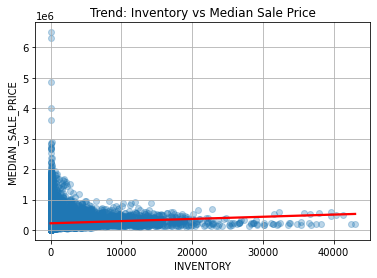

In [0]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.regplot(
    data=pandas_df,
    x="INVENTORY",
    y="MEDIAN_SALE_PRICE",
    scatter_kws={"alpha": 0.3},
    line_kws={"color": "red"}  # Change line color here
)

plt.title("Trend: Inventory vs Median Sale Price")
plt.grid(True)
plt.show()


In [0]:
from pyspark.ml.regression import DecisionTreeRegressor
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.tuning import TrainValidationSplit, CrossValidator, ParamGridBuilder
import time


In [0]:
dt = DecisionTreeRegressor(labelCol="label", featuresCol="normFeatures")
pipeline = Pipeline(stages=[assembler, scaler, dt])


In [0]:
paramGrid = ParamGridBuilder() \
    .addGrid(dt.maxDepth, [5, 10]) \
    .addGrid(dt.maxBins, [32, 64]) \
    .build()


In [0]:
start_time_tvs = time.time()

tvs = TrainValidationSplit(
    estimator=pipeline,
    estimatorParamMaps=paramGrid,
    evaluator=RegressionEvaluator(labelCol="label", predictionCol="prediction", metricName="rmse"),
    trainRatio=0.8
)

model_tvs = tvs.fit(train_data)
end_time_tvs = time.time()


In [0]:
start_time_cv = time.time()

cv = CrossValidator(
    estimator=pipeline,
    estimatorParamMaps=paramGrid,
    evaluator=RegressionEvaluator(labelCol="label", predictionCol="prediction", metricName="rmse"),
    numFolds=3
)

model_cv = cv.fit(train_data)
end_time_cv = time.time()


In [0]:
pred_tvs = model_tvs.transform(test_data)
pred_cv = model_cv.transform(test_data)

evaluator_rmse = RegressionEvaluator(labelCol="label", predictionCol="prediction", metricName="rmse")
evaluator_r2 = RegressionEvaluator(labelCol="label", predictionCol="prediction", metricName="r2")

print("----- TVS Model Evaluation -----")
print("RMSE:", evaluator_rmse.evaluate(pred_tvs))
print("R²:", evaluator_r2.evaluate(pred_tvs))
print("Execution Time (TVS): {:.2f} seconds".format(end_time_tvs - start_time_tvs))

print("\n----- CV Model Evaluation -----")
print("RMSE:", evaluator_rmse.evaluate(pred_cv))
print("R²:", evaluator_r2.evaluate(pred_cv))
print("Execution Time (CV): {:.2f} seconds".format(end_time_cv - start_time_cv))


----- TVS Model Evaluation -----
RMSE: 96777.44789842024
R²: 0.7329265125498214
Execution Time (TVS): 210.12 seconds

----- CV Model Evaluation -----
RMSE: 80703.61875728925
R²: 0.8142758134072039
Execution Time (CV): 371.96 seconds


In [0]:
best_model = model_tvs.bestModel.stages[-1]  # Get the Decision Tree stage
feature_importances = best_model.featureImportances

# Print feature importance mapped to column names
print("\nFeature Importances:")
for i, col_name in enumerate(feature_cols):
    print(f"{col_name}: {feature_importances[i]:.4f}")



Feature Importances:
HOMES_SOLD: 0.0169
NEW_LISTINGS: 0.0222
INVENTORY: 0.0159
MONTHS_OF_SUPPLY: 0.0063
MEDIAN_LIST_PRICE: 0.6916
MEDIAN_PPSF: 0.2395
PENDING_SALES: 0.0076


+------------------+--------+
|        prediction|   label|
+------------------+--------+
| 26377.41095890411| 40000.0|
|142068.38535031848| 77900.0|
|201859.16003616637|295000.0|
|142068.38535031848| 62000.0|
|201859.16003616637|235000.0|
|  34878.0325732899| 18500.0|
|100813.08193597561| 84500.0|
|100813.08193597561|130000.0|
|231375.09023485784|105000.0|
| 92824.78877005348| 74300.0|
+------------------+--------+
only showing top 10 rows



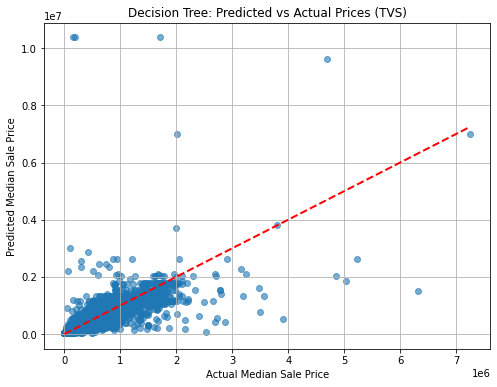

In [0]:
# Select prediction and actual label from TVS model
prediction_vs_actual = pred_tvs.select("prediction", "label")

# Show sample rows
prediction_vs_actual.show(10)
# Convert to pandas for visualization
pdf = prediction_vs_actual.toPandas()
import matplotlib.pyplot as plt

# Scatter plot of predictions vs actual values
plt.figure(figsize=(8, 6))
plt.scatter(pdf['label'], pdf['prediction'], alpha=0.6)
plt.plot([pdf['label'].min(), pdf['label'].max()],
         [pdf['label'].min(), pdf['label'].max()],
         color='red', linestyle='--', linewidth=2)
plt.xlabel("Actual Median Sale Price")
plt.ylabel("Predicted Median Sale Price")
plt.title("Decision Tree: Predicted vs Actual Prices (TVS)")
plt.grid(True)
plt.show()


In [0]:
from pyspark.ml.regression import GBTRegressor
from pyspark.ml.tuning import TrainValidationSplit, CrossValidator, ParamGridBuilder
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml import Pipeline
import time


In [0]:
gbt = GBTRegressor(labelCol="label", featuresCol="normFeatures", maxIter=50)
pipeline_gbt = Pipeline(stages=[assembler, scaler, gbt])


In [0]:
paramGrid_gbt = ParamGridBuilder() \
    .addGrid(gbt.maxDepth, [3, 5]) \
    .addGrid(gbt.maxIter, [20, 50]) \
    .build()


In [0]:
start_time_tvs_gbt = time.time()

tvs_gbt = TrainValidationSplit(
    estimator=pipeline_gbt,
    estimatorParamMaps=paramGrid_gbt,
    evaluator=RegressionEvaluator(labelCol="label", predictionCol="prediction", metricName="rmse"),
    trainRatio=0.8
)

model_tvs_gbt = tvs_gbt.fit(train_data)
end_time_tvs_gbt = time.time()


In [0]:
start_time_cv_gbt = time.time()

cv_gbt = CrossValidator(
    estimator=pipeline_gbt,
    estimatorParamMaps=paramGrid_gbt,
    evaluator=RegressionEvaluator(labelCol="label", predictionCol="prediction", metricName="rmse"),
    numFolds=3
)

model_cv_gbt = cv_gbt.fit(train_data)
end_time_cv_gbt = time.time()


In [0]:
pred_tvs_gbt = model_tvs_gbt.transform(test_data)
pred_cv_gbt = model_cv_gbt.transform(test_data)

print("----- GBT TVS Model Evaluation -----")
print("RMSE:", evaluator_rmse.evaluate(pred_tvs_gbt))
print("R²:", evaluator_r2.evaluate(pred_tvs_gbt))
print("Execution Time (TVS): {:.2f} seconds".format(end_time_tvs_gbt - start_time_tvs_gbt))

print("\n----- GBT CV Model Evaluation -----")
print("RMSE:", evaluator_rmse.evaluate(pred_cv_gbt))
print("R²:", evaluator_r2.evaluate(pred_cv_gbt))
print("Execution Time (CV): {:.2f} seconds".format(end_time_cv_gbt - start_time_cv_gbt))


----- GBT TVS Model Evaluation -----
RMSE: 88461.05249824573
R²: 0.7768552612907269
Execution Time (TVS): 1509.93 seconds

----- GBT CV Model Evaluation -----
RMSE: 85666.11793459005
R²: 0.7907330616072379
Execution Time (CV): 2790.97 seconds


In [0]:
best_model_gbt = model_tvs_gbt.bestModel.stages[-1]  # GBT stage
gbt_importances = best_model_gbt.featureImportances.toArray()

print("\nGBT Feature Importances:")
for i, col_name in enumerate(feature_cols):
    print(f"{col_name}: {gbt_importances[i]:.4f}")



GBT Feature Importances:
HOMES_SOLD: 0.0250
NEW_LISTINGS: 0.0487
INVENTORY: 0.0203
MONTHS_OF_SUPPLY: 0.0258
MEDIAN_LIST_PRICE: 0.5815
MEDIAN_PPSF: 0.2777
PENDING_SALES: 0.0211


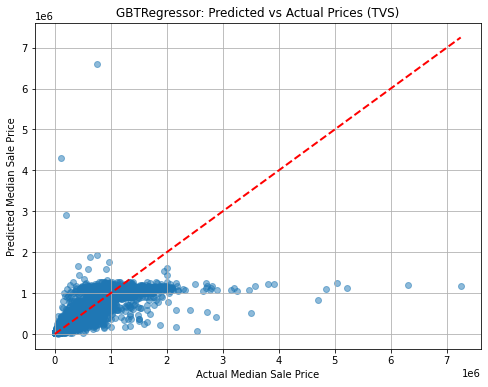

In [0]:
pred_vs_actual_gbt = pred_tvs_gbt.select("prediction", "label").toPandas()

plt.figure(figsize=(8, 6))
plt.scatter(pred_vs_actual_gbt['label'], pred_vs_actual_gbt['prediction'], alpha=0.5)
plt.plot([pred_vs_actual_gbt['label'].min(), pred_vs_actual_gbt['label'].max()],
         [pred_vs_actual_gbt['label'].min(), pred_vs_actual_gbt['label'].max()],
         color='red', linestyle='--', linewidth=2)
plt.xlabel("Actual Median Sale Price")
plt.ylabel("Predicted Median Sale Price")
plt.title("GBTRegressor: Predicted vs Actual Prices (TVS)")
plt.grid(True)
plt.savefig("plot_output_gbt.png")


In [0]:
from pyspark.sql.functions import when

# Create binary label column for classification
df_class = df.withColumn("label", when(col("MEDIAN_SALE_PRICE") >= 500000, 1).otherwise(0))


In [0]:
final_data_class = df_class.select(*feature_cols, "label").dropna()
train_data_class, test_data_class = final_data_class.randomSplit([0.8, 0.2], seed=42)


In [0]:
from pyspark.ml.classification import GBTClassifier
from pyspark.ml.evaluation import BinaryClassificationEvaluator

gbt_cls = GBTClassifier(labelCol="label", featuresCol="normFeatures", maxIter=50)
pipeline_cls = Pipeline(stages=[assembler, scaler, gbt_cls])

paramGrid_cls = ParamGridBuilder() \
    .addGrid(gbt_cls.maxDepth, [3, 5]) \
    .addGrid(gbt_cls.maxIter, [20, 50]) \
    .build()


In [0]:
tvs_cls = TrainValidationSplit(
    estimator=pipeline_cls,
    estimatorParamMaps=paramGrid_cls,
    evaluator=BinaryClassificationEvaluator(labelCol="label", metricName="areaUnderROC"),
    trainRatio=0.8
)

start_tvs_cls = time.time()
model_tvs_cls = tvs_cls.fit(train_data_class)
end_tvs_cls = time.time()


In [0]:
cv_cls = CrossValidator(
    estimator=pipeline_cls,
    estimatorParamMaps=paramGrid_cls,
    evaluator=BinaryClassificationEvaluator(labelCol="label", metricName="areaUnderROC"),
    numFolds=3
)

start_cv_cls = time.time()
model_cv_cls = cv_cls.fit(train_data_class)
end_cv_cls = time.time()


In [0]:
pred_tvs_cls = model_tvs_cls.transform(test_data_class)
pred_cv_cls = model_cv_cls.transform(test_data_class)

evaluator_auc = BinaryClassificationEvaluator(labelCol="label", metricName="areaUnderROC")

print("----- GBTClassifier TVS Evaluation -----")
print("AUC:", evaluator_auc.evaluate(pred_tvs_cls))
print("Execution Time (TVS): {:.2f} sec".format(end_tvs_cls - start_tvs_cls))

print("\n----- GBTClassifier CV Evaluation -----")
print("AUC:", evaluator_auc.evaluate(pred_cv_cls))
print("Execution Time (CV): {:.2f} sec".format(end_cv_cls - start_cv_cls))


----- GBTClassifier TVS Evaluation -----
AUC: 0.9939654493703334
Execution Time (TVS): 1493.98 sec

----- GBTClassifier CV Evaluation -----
AUC: 0.9939570120832761
Execution Time (CV): 3210.61 sec


In [0]:
best_model_cls = model_tvs_cls.bestModel.stages[-1]
importance_cls = best_model_cls.featureImportances.toArray()

print("\nGBTClassifier Feature Importances:")
for i, col_name in enumerate(feature_cols):
    print(f"{col_name}: {importance_cls[i]:.4f}")



GBTClassifier Feature Importances:
HOMES_SOLD: 0.0264
NEW_LISTINGS: 0.0271
INVENTORY: 0.0135
MONTHS_OF_SUPPLY: 0.0194
MEDIAN_LIST_PRICE: 0.7734
MEDIAN_PPSF: 0.1247
PENDING_SALES: 0.0154
